## Importing Libraries

In [1]:
# lets import the basic libraries
import pandas as pd
import numpy as np
import xlrd
import dabl
import pandas_profiling as profile

# for data visualizations
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.graph_objects as go
import plotly.express as px
from bubbly.bubbly import bubbleplot 
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot

# for interactive analysis
import ipywidgets as widgets
from ipywidgets import interact
from ipywidgets import interact_manual

## Reading the Dataset

In [2]:
# lets read the dataset

rape = pd.read_csv('rape.csv')
murder = pd.read_csv('murder.csv')
crimes = pd.read_csv('crimes.csv')
abduction = pd.read_excel('abduction.xls')
accident = pd.read_excel('accidents.xls')

# lets also check the shape of the datasets
print("Shape of Rape Dataset", rape.shape)
print("Shape of Murder Dataset", murder.shape)
print("Shape of Abduction Dataset", abduction.shape)
print("Shape of crimes Dataset", crimes.shape)
print("Shape of Accidents Dataset", accident.shape)

WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero
Shape of Rape Dataset (456, 14)
Shape of Murder Dataset (105, 10)
Shape of Abduction Dataset (35, 7)
Shape of crimes Dataset (5866, 19)
Shape of Accidents Dataset (52, 30)


In [3]:
# lets check if there is any missing values present in the dataset

print("Number of Null Values in Crime Data: ", crimes.isnull().sum().sum())
print("Number of Null Values in Rape Data: ", rape.isnull().sum().sum())
print("Number of Null Values in Accident Data: ", accident.isnull().sum().sum())
print("Number of Null Values in Murder Data: ", murder.isnull().sum().sum())
print("Number of Null Values in Abduction Data: ", abduction.isnull().sum().sum())

Number of Null Values in Crime Data:  0
Number of Null Values in Rape Data:  0
Number of Null Values in Accident Data:  74
Number of Null Values in Murder Data:  0
Number of Null Values in Abduction Data:  0


## Analyzing Crimes

In [4]:
# lets check a sample of the crime dataset
crimes.sample(3)

,STATE/UT,YEAR,Pupose,Total No. of cases reported,Male upto 10 years,Female upto 10 years,Male 10-15 years,Female 10-15 years,Male 15-18 years,Female 15-18 years,Male 18-30 years,Female 18-30 years,Male 30-50 years,Female 30-50 years,Male above 50 years,Female above 50 years,Total Male,Total Female,Grand Total
1576,Jammu & Kashmir,2005,For Sale,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4540,West Bengal,2001,For marriage,334,0,0,0,27,0,141,0,164,0,2,0,0,0,334,334
3458,Punjab,2008,For Adoption,28,0,0,0,0,0,0,3,24,0,1,0,0,3,25,28


In [5]:
# lets check the head of the Crimes Dataset

pd.set_option('max_columns', 100)
crimes.head(3)

,STATE/UT,YEAR,Pupose,Total No. of cases reported,Male upto 10 years,Female upto 10 years,Male 10-15 years,Female 10-15 years,Male 15-18 years,Female 15-18 years,Male 18-30 years,Female 18-30 years,Male 30-50 years,Female 30-50 years,Male above 50 years,Female above 50 years,Total Male,Total Female,Grand Total
0,Andhra Pradesh,2001,For Adoption,8,3,1,0,0,0,0,0,4,0,0,0,0,3,5,8
1,Andhra Pradesh,2001,For Begging,2,0,0,2,0,0,0,0,0,0,0,0,0,2,0,2
2,Andhra Pradesh,2001,For Camel racing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [6]:
# lets check the basic statistics of the data
pd.set_option('max_columns', 100)
x = crimes.describe()
x

,YEAR,Total No. of cases reported,Male upto 10 years,Female upto 10 years,Male 10-15 years,Female 10-15 years,Male 15-18 years,Female 15-18 years,Male 18-30 years,Female 18-30 years,Male 30-50 years,Female 30-50 years,Male above 50 years,Female above 50 years,Total Male,Total Female,Grand Total
count,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000,5866.000000
mean,2006.513126,121.667917,1.802932,1.216161,2.426526,6.320491,2.510740,19.857143,16.400614,52.993863,8.548585,9.842823,0.955336,0.363450,32.644732,90.593931,123.238663
std,3.445978,465.198526,16.321285,9.121776,30.860644,36.194204,17.738711,117.901238,75.366121,218.121242,36.858145,54.903563,7.395493,6.547786,141.072094,377.255718,469.614659
min,2001.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2004.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2007.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2010.000000,21.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,4.000000,7.000000,22.000000
max,2012.000000,8878.000000,408.000000,209.000000,953.000000,906.000000,530.000000,3081.000000,1371.000000,3682.000000,1042.000000,1053.000000,334.000000,332.000000,2465.000000,7919.000000,8888.000000


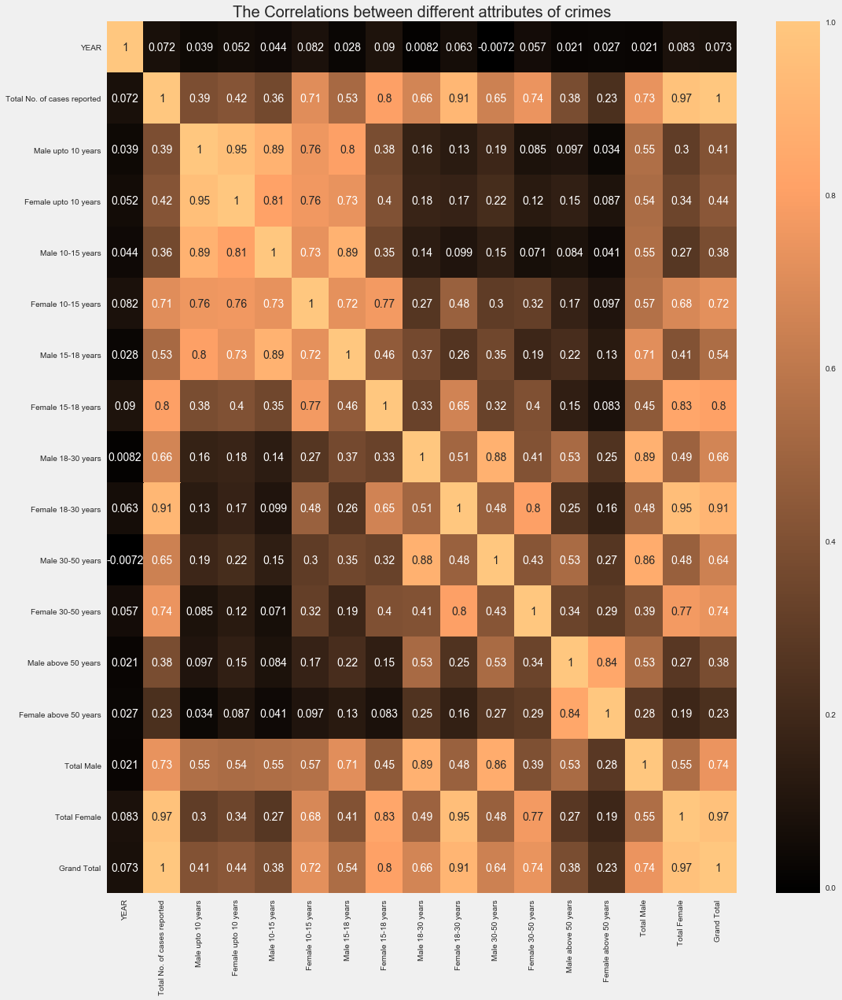

In [9]:
# lets check the heatmap of the crimes data

plt.rcParams['figure.figsize'] = (16, 19)
plt.style.use('fivethirtyeight')

sns.heatmap(crimes.corr(),
            cmap = 'copper',
            annot  = True)
plt.title('The Correlations between different attributes of crimes', fontsize = 20)
plt.show()

In [7]:
# lets check the columns in the crimes table
crimes.columns

Index(['STATE/UT', 'YEAR', 'Pupose', 'Total No. of cases reported',
       'Male upto 10 years', 'Female upto 10 years', 'Male 10-15 years',
       'Female 10-15 years', 'Male 15-18 years', 'Female 15-18 years',
       'Male 18-30 years', 'Female 18-30 years', 'Male 30-50 years',
       'Female 30-50 years', 'Male above 50 years', 'Female above 50 years',
       'Total Male', 'Total Female', 'Grand Total'],
      dtype='object')

In [8]:
# lets check the different types of Purposes in commiting crimes
crimes['Pupose'].value_counts()

For Adoption               420
For Illicit intercourse    419
For Prostitution           419
Total                      419
Others                     419
For marriage               419
For Sale                   419
For Camel racing           419
For Selling body parts     419
For Ransom                 419
For Slavery                419
For Revenge                419
For Begging                418
For unlawaful activity     418
For unlawful activity        1
Name: Pupose, dtype: int64

In [9]:
# lets check the years for which the data is present
crimes['YEAR'].value_counts()

2011    490
2007    490
2003    490
2010    490
2006    490
2002    490
2009    490
2005    490
2012    490
2008    490
2004    490
2001    476
Name: YEAR, dtype: int64

In [10]:
profile.ProfileReport(crimes)

In [13]:
import warnings
warnings.filterwarnings('ignore')


figure = bubbleplot(dataset = crimes,
                    x_column='Total_Male',
                    y_column='Total_Female',
                    bubble_column = 'Pupose',
                  
                    size_column='Total_No._of_cases_reported',
                    color_column='STATE/UT', 
                    
                    x_title="Offenders_known",
                    y_title="Offenders_Relatives",
                    title='Offenders_known_vs_Relatives',

                   )

iplot(figure, config={'scrollzoom': True})

In [36]:
@interact
def check(States = list(crimes['STATE/UT'].value_counts().index),
          year = list(crimes['YEAR'].value_counts().index)):
    c = crimes[crimes['STATE/UT'] == States]
    c = c.loc[c['YEAR'] == year]
    return c

interactive(children=(Dropdown(description='States', options=('Gujarat', 'Chhattisgarh', 'Kerala', 'Lakshadwee…

In [14]:
@interact
def check(column = ['Total_No
       'Male_upto_10_years', 'Female_upto_10_years', 'Male_10-15_years',
       'Female_10-15_years', 'Male_15-18_years', 'Female_15-18_years',
       'Male_18-30_years', 'Female_18-30_years', 'Male_30-50_years',
       'Female_30-50_years', 'Male_above_50_years', 'Female_above_50_years',
       'Total_Male', 'Total_Female'],
          x = 10):
    return crimes.loc[crimes[column] > x]
    

interactive(children=(Dropdown(description='column', options=('Total_No._of_cases_reported', 'Male_upto_10_yea…

In [5]:
@interact
def check(Purpose = list(crimes['Pupose'].value_counts().index),
          No_of_cases = 10):
    c = crimes[['STATE/UT', 'YEAR', 'Total No. of cases reported']]
    c = c.loc[crimes['Pupose'] == Purpose]
    c = c.loc[crimes['Total No. of cases reported'] > No_of_cases]
    return c

interactive(children=(Dropdown(description='Purpose', options=('For Adoption', 'For Illicit intercourse', 'For…

In [7]:
@interact
def check(Purpose = list(crimes['Pupose'].value_counts().index),
          States = list(crimes['STATE/UT'].value_counts().index),
          No_of_cases = 5,):
    c = crimes[['STATE/UT', 'YEAR', 'Total No. of cases reported', 'Total Male', 'Total Female']]
    c = c.loc[crimes['Pupose'] == Purpose]
    c = c.loc[crimes['STATE/UT'] == States]
    c = c.loc[crimes['Total No. of cases reported'] > No_of_cases]
    return c

interactive(children=(Dropdown(description='Purpose', options=('For Adoption', 'For Illicit intercourse', 'For…

In [68]:
# lets try to check the crime purposes in the States of Andhra Pradesh

a = crimes[crimes['STATE/UT'] == 'Andhra Pradesh']
a = a.drop(['YEAR',
            'Total Female',
            'Grand Total',
            'Total Male'], axis = 1)
a = a.groupby(['Pupose']).agg('mean')
a = pd.DataFrame(a)
a = a.iloc[:-2, :]
a = pd.DataFrame(a)
a.style.bar(color = ['silver'], align = 'mid')

,Total No. of cases reported,Male upto 10 years,Female upto 10 years,Male 10-15 years,Female 10-15 years,Male 15-18 years,Female 15-18 years,Male 18-30 years,Female 18-30 years,Male 30-50 years,Female 30-50 years,Male above 50 years,Female above 50 years
Pupose,,,,,,,,,,,,,
For Adoption,2.58333,1,0.5,0.0833333,0,0,0,0.25,0.666667,0.166667,0,0,0
For Begging,3.58333,0.416667,0.25,0.416667,0.166667,0,0,1.83333,0.0833333,0.0833333,0.333333,0,0
For Camel racing,0.25,0,0,0,0,0,0,0,0.0833333,0,0.166667,0,0
For Illicit intercourse,123.833,0,1.33333,0.0833333,16.0833,0.166667,30.5833,1.83333,63.1667,0.75,9.66667,0,0.333333
For Prostitution,38.25,0,0,0,2,0,6.58333,2.66667,23.4167,1.5,1.58333,0,0
For Ransom,19.4167,2,1.16667,0.916667,0.916667,0.833333,1.58333,5,4.08333,2.16667,0.166667,0.5,0.0833333
For Revenge,48.75,3.33333,3.25,1.75,1.33333,1.08333,2.25,14.4167,7.75,10,0.75,2.91667,0.166667
For Sale,4.08333,0.583333,0.666667,0.416667,0.25,0,0.583333,0,1.41667,0,0.5,0,0
For Selling body parts,0,0,0,0,0,0,0,0,0,0,0,0,0


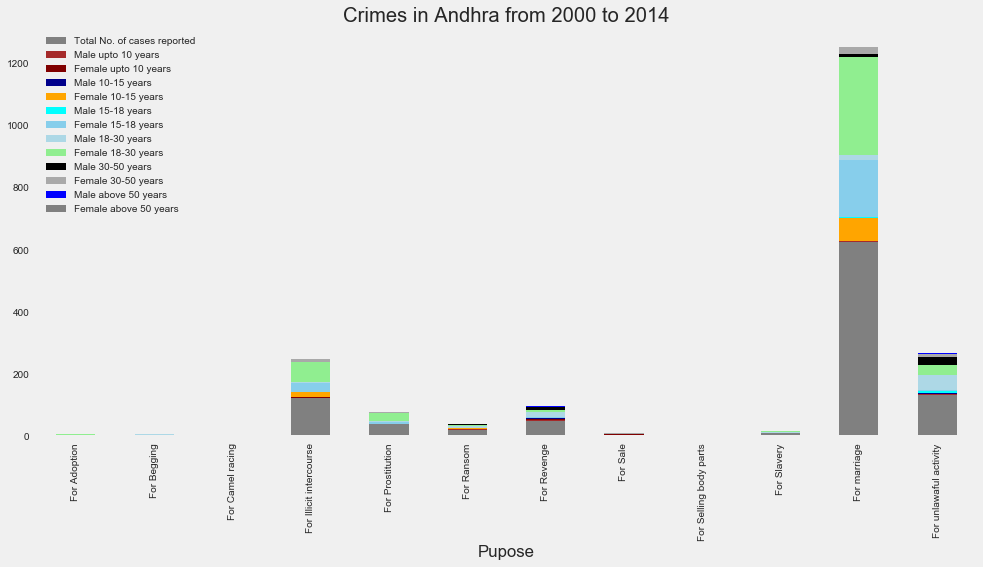

In [75]:
# lets check the crime status in the state of Andhra Pradesh

plt.rcParams['figure.figsize'] = (15, 7)
plt.style.use('fivethirtyeight')

a = crimes[crimes['STATE/UT'] == 'Andhra Pradesh']
a = a.drop(['YEAR',
            'Total Female',
            'Grand Total',
            'Total Male'], axis = 1)
a = a.groupby(['Pupose']).agg('mean')
a = pd.DataFrame(a)
a = a.iloc[:-2, :]
a = pd.DataFrame(a)
a.plot(kind = 'bar', 
       stacked = True,
       colors = ['grey','brown','maroon',
                 'darkblue','orange','cyan',
                 'skyblue','lightblue','lightgreen',
                 'black','darkgrey','blue'])
plt.title('Crimes in Andhra from 2000 to 2014')
plt.legend()
plt.grid()
plt.show()

In [70]:
# lets make an interactive function to check crimes in every state of india

def check_crime(x):
    a = crimes[crimes['STATE/UT'] == x]
    a = a.drop(['YEAR',
                'Total Female',
                'Grand Total',
                'Total Male'], axis = 1)
    a = a.groupby(['Pupose']).agg('mean')
    a = pd.DataFrame(a)
    a = a.iloc[:-2, :]
    a = pd.DataFrame(a)
    return a.style.bar(color = ['silver'], align = 'mid')

In [72]:
check_crime('Punjab')

,Total No. of cases reported,Male upto 10 years,Female upto 10 years,Male 10-15 years,Female 10-15 years,Male 15-18 years,Female 15-18 years,Male 18-30 years,Female 18-30 years,Male 30-50 years,Female 30-50 years,Male above 50 years,Female above 50 years
Pupose,,,,,,,,,,,,,
For Adoption,4.75,1.33333,0.583333,0,0.166667,0,0.0833333,0.5,2,0,0.0833333,0,0
For Begging,0.416667,0.0833333,0,0,0.166667,0,0,0.416667,0,0,0,0,0
For Camel racing,0,0,0,0,0,0,0,0,0,0,0,0,0
For Illicit intercourse,45.5,0.0833333,0.333333,0.25,5.58333,0.666667,10.8333,0.333333,26.0833,0,2.58333,0,0
For Prostitution,0.583333,0.0833333,0,0,0.333333,0,0.166667,0,0,0,0,0,0
For Ransom,9.08333,2.83333,0.333333,0.75,0.166667,0.833333,0.0833333,2.5,0.416667,0.916667,0.0833333,0.416667,0
For Revenge,6.83333,0.666667,0.166667,0.0833333,0,0.333333,0.333333,2.08333,0.583333,2.5,0.25,0.166667,0
For Sale,0.666667,0.166667,0.333333,0,0.0833333,0,0,0,0,0,0.0833333,0,0
For Selling body parts,0,0,0,0,0,0,0,0,0,0,0,0,0


In [76]:
check_crime('Uttar Pradesh')

,Total No. of cases reported,Male upto 10 years,Female upto 10 years,Male 10-15 years,Female 10-15 years,Male 15-18 years,Female 15-18 years,Male 18-30 years,Female 18-30 years,Male 30-50 years,Female 30-50 years,Male above 50 years,Female above 50 years
Pupose,,,,,,,,,,,,,
For Adoption,2.83333,0.5,0.0833333,0,0.0833333,0.166667,0.0833333,1.41667,0.25,0.25,0,0,0
For Begging,1.66667,0.75,0.166667,0.75,0,0,0.0833333,0,0,0,0,0,0
For Camel racing,0,0,0,0,0,0,0,0,0,0,0,0,0
For Illicit intercourse,1114.42,0.0833333,3,0.916667,96.25,1.66667,267.083,3.33333,581.083,9.25,150.25,0,1.08333
For Prostitution,9.16667,0,0,0,0.166667,0.333333,2.58333,0.0833333,5.41667,0,0.583333,0,0
For Ransom,134.917,11.25,1.08333,20.5833,0.833333,16.0833,0.833333,55,4,28.6667,1.83333,3,0
For Revenge,205.083,2.08333,1.83333,5.91667,2.91667,19.5833,4.5,104.25,6.33333,53.0833,1.25,3.41667,0
For Sale,2.08333,0.0833333,0.0833333,0,0.333333,0,0.916667,0.416667,0.0833333,0.166667,0,0,0
For Selling body parts,0,0,0,0,0,0,0,0,0,0,0,0,0


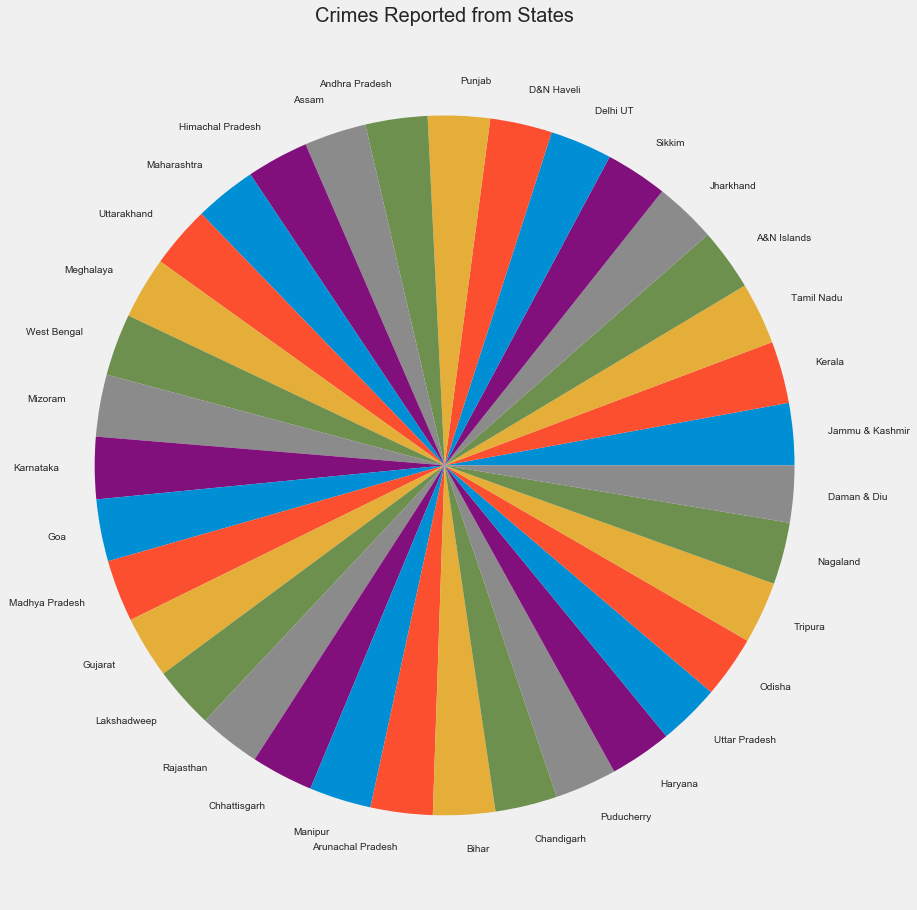

In [15]:
# lets check the States for which these crimes are being reported
plt.rcParams['figure.figsize'] = (15, 15)
plt.style.use('fivethirtyeight')
crimes['STATE/UT'].value_counts().plot(kind = 'pie')
plt.axis('off')
plt.title('Crimes Reported from States', fontsize = 20)
plt.show()

In [79]:
# lets check the number of states in the dataset
print('\n\n Value Counts :', crimes['STATE/UT'].value_counts())
print(crimes['STATE/UT'].nunique())



 Value Counts : Jammu & Kashmir      168
Kerala               168
Tamil Nadu           168
A&N Islands          168
Jharkhand            168
Sikkim               168
Delhi UT             168
D&N Haveli           168
Punjab               168
Andhra Pradesh       168
Assam                168
Himachal Pradesh     168
Maharashtra          168
Uttarakhand          168
Meghalaya            168
West Bengal          168
Mizoram              168
Karnataka            168
Goa                  168
Madhya Pradesh       168
Gujarat              168
Lakshadweep          168
Rajasthan            168
Chhattisgarh         168
Manipur              168
Arunachal Pradesh    168
Bihar                168
Chandigarh           168
Puducherry           168
Haryana              168
Uttar Pradesh        168
Odisha               168
Tripura              168
Nagaland             168
Daman & Diu          154
Name: STATE/UT, dtype: int64
35


In [83]:
x = crimes['STATE/UT']
x.value_counts().index

Index(['Jammu & Kashmir', 'Kerala', 'Tamil Nadu', 'A&N Islands', 'Jharkhand',
       'Sikkim', 'Delhi UT', 'D&N Haveli', 'Punjab', 'Andhra Pradesh', 'Assam',
       'Himachal Pradesh', 'Maharashtra', 'Uttarakhand', 'Meghalaya',
       'West Bengal', 'Mizoram', 'Karnataka', 'Goa', 'Madhya Pradesh',
       'Gujarat', 'Lakshadweep', 'Rajasthan', 'Chhattisgarh', 'Manipur',
       'Arunachal Pradesh', 'Bihar', 'Chandigarh', 'Puducherry', 'Haryana',
       'Uttar Pradesh', 'Odisha', 'Tripura', 'Nagaland', 'Daman & Diu'],
      dtype='object')

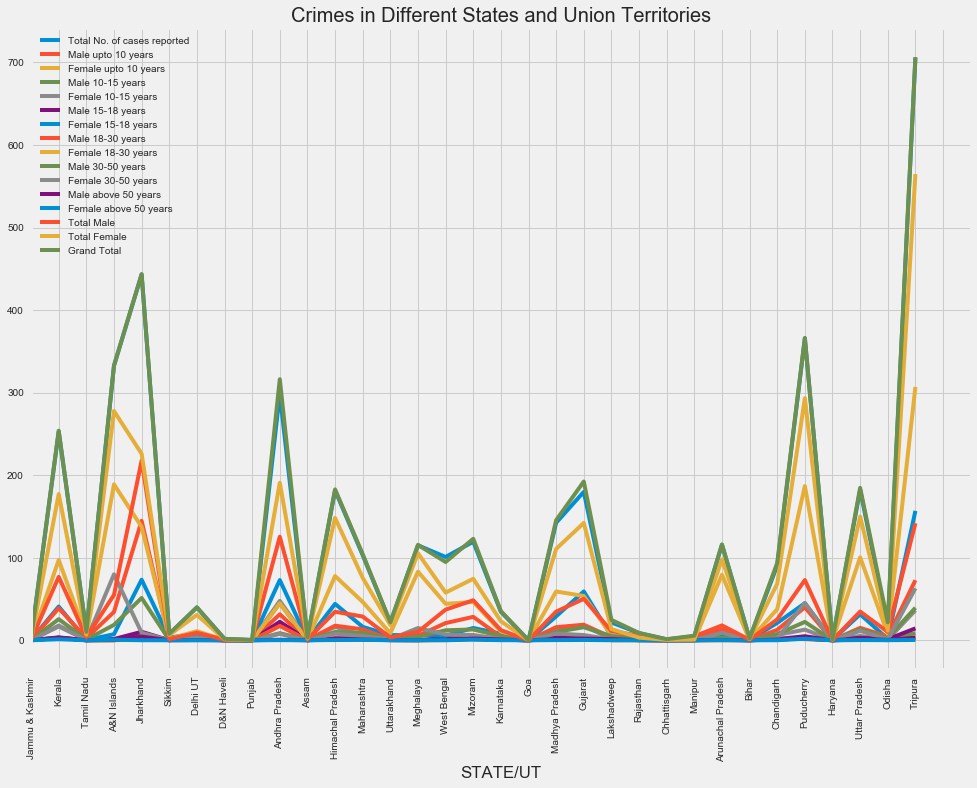

In [85]:
# lets check the crimes in a comparitive way

plt.rcParams['figure.figsize'] = (15, 11)
plt.style.use('fivethirtyeight')

x = crimes.groupby(['STATE/UT'])
x = x.agg('mean')[:-2]
x.drop(['YEAR'], axis = 1, inplace = True)
x = x.plot(kind = 'line')

plt.title('Crimes in Different States and Union Territories', fontsize = 20)
plt.xticks(np.arange(35), ('Jammu & Kashmir', 'Kerala', 'Tamil Nadu', 'A&N Islands', 'Jharkhand',
       'Sikkim', 'Delhi UT', 'D&N Haveli', 'Punjab', 'Andhra Pradesh', 'Assam',
       'Himachal Pradesh', 'Maharashtra', 'Uttarakhand', 'Meghalaya',
       'West Bengal', 'Mizoram', 'Karnataka', 'Goa', 'Madhya Pradesh',
       'Gujarat', 'Lakshadweep', 'Rajasthan', 'Chhattisgarh', 'Manipur',
       'Arunachal Pradesh', 'Bihar', 'Chandigarh', 'Puducherry', 'Haryana',
       'Uttar Pradesh', 'Odisha', 'Tripura'),
        rotation = 90)
plt.show()

In [17]:
crimes.columns

Index(['STATE/UT', 'YEAR', 'Pupose', 'Total_No._of_cases_reported',
       'Male_upto_10_years', 'Female_upto_10_years', 'Male_10-15_years',
       'Female_10-15_years', 'Male_15-18_years', 'Female_15-18_years',
       'Male_18-30_years', 'Female_18-30_years', 'Male_30-50_years',
       'Female_30-50_years', 'Male_above_50_years', 'Female_above_50_years',
       'Total_Male', 'Total_Female', 'Grand_Total'],
      dtype='object')

In [8]:
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (15, 11)
plt.style.use('fivethirtyeight')

@interact_manual
def check(column = 'Pupose',
          column2 = ['Total No. of cases reported',
       'Male upto 10 years', 'Female upto 10 years', 'Male 10-15 years',
       'Female 10-15 years', 'Male 15-18 years', 'Female 15-18 years',
       'Male 18-30 years', 'Female 18-30 years', 'Male 30-50 years',
       'Female 30-50 years', 'Male above 50 years', 'Female above 50 years',
       'Total Male', 'Total Female', 'Grand Total',],
          colors = ['spring','summer','copper','Blues','Reds']):
    sns.barplot(crimes[column], crimes[column2], palette = colors)
    plt.xticks(rotation = 90)
    plt.show()

interactive(children=(Text(value='Pupose', description='column'), Dropdown(description='column2', options=('To…

In [39]:
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (15, 11)
plt.style.use('fivethirtyeight')

@interact_manual
def check(column = 'YEAR',
          column2 = ['Total_No._of_cases_reported',
       'Male upto 10 years', 'Female upto 10 years', 'Male 10-15 years',
       'Female 10-15 years', 'Male 15-18 years', 'Female 15-18 years',
       'Male 18-30 years', 'Female 18-30 years', 'Male 30-50 years',
       'Female 30-50 years', 'Male above 50 years', 'Female above 50 years',
       'Total Male', 'Total Female', 'Grand Total',],
          colors = ['black','blue','red']):
    sns.lineplot(crimes[column], crimes[column2], color = colors)
    plt.xticks(rotation = 90)
    plt.show()

interactive(children=(Text(value='YEAR', description='column'), Dropdown(description='column2', options=('Tota…

In [9]:
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (15, 11)
plt.style.use('fivethirtyeight')

@interact_manual
def check(column = 'YEAR',
          column2 = ['Total No. of cases reported',
       'Male upto 10 years', 'Female upto 10 years', 'Male 10-15 years',
       'Female 10-15 years', 'Male 15-18 years', 'Female 15-18 years',
       'Male 18-30 years', 'Female 18-30 years', 'Male 30-50 years',
       'Female 30-50 years', 'Male above 50 years', 'Female above 50 years',
       'Total Male', 'Total Female', 'Grand Total',],
          colors = ['Reds','Blues','spring','summer','winter']):
    sns.boxenplot(crimes[column], crimes[column2], palette = colors)
    plt.xticks(rotation = 90)
    plt.show()

interactive(children=(Text(value='YEAR', description='column'), Dropdown(description='column2', options=('Tota…

In [44]:
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (15, 11)
plt.style.use('fivethirtyeight')

@interact_manual
def check(column =  ['Total_No._of_cases_reported',
       'Male_upto_10_years', 'Female upto 10 years', 'Male 10-15 years',
       'Female 10-15 years', 'Male 15-18 years', 'Female 15-18 years',
       'Male 18-30 years', 'Female 18-30 years', 'Male 30-50 years',
       'Female 30-50 years', 'Male above 50 years', 'Female above 50 years',
       'Total Male', 'Total Female', 'Grand Total',],
          column2 = [
       'Male_upto_10_years', 'Female upto 10 years', 'Male 10-15 years',
       'Female 10-15 years', 'Male 15-18 years', 'Female 15-18 years',
       'Male 18-30 years', 'Female 18-30 years', 'Male 30-50 years',
       'Female 30-50 years', 'Male above 50 years', 'Female above 50 years',
       'Total Male', 'Total Female', 'Grand Total',],
          colors = ['black','darkgrey', 'blue',]):
    sns.scatterplot(crimes[column], crimes[column2], color = colors)
    plt.xticks(rotation = 90)
    plt.grid()
    plt.show()

interactive(children=(Dropdown(description='column', options=('Total_No._of_cases_reported', 'Male_upto_10_yea…

## Analyzing Rape Cases

In [45]:
# lets check the head of the Rape Dataset

pd.set_option('max_columns', 100)
rape.head()

,STATE/UT,CRIME HEAD,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
0,ANDHRA PRADESH,RAPE,1150,1340,1237,1443,1415,1360,1436,1531,1487,1761,1758,1664
1,ARUNACHAL PRADESH,RAPE,51,61,35,56,38,40,57,37,60,49,47,47
2,ASSAM,RAPE,928,1019,1188,1233,1406,1290,1477,1445,1644,1629,1470,1626
3,BIHAR,RAPE,1400,1304,1120,1157,1455,1451,1816,1464,1086,892,1185,1327
4,CHHATTISGARH,RAPE,1134,1214,1020,1144,1107,1211,1146,1108,1128,1198,1257,1214


In [46]:
# lets check the tail of the data
rape.tail()

,STATE/UT,CRIME HEAD,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
451,DELHI,TOTAL CRIMES AGAINST WOMEN,3124,3080,4789,5196,5853,6207,5648,3115,2753,3040,3475,3981
452,LAKSHADWEEP,TOTAL CRIMES AGAINST WOMEN,0,3,3,1,0,1,2,2,2,1,0,1
453,PUDUCHERRY,TOTAL CRIMES AGAINST WOMEN,223,246,221,173,191,260,337,191,152,205,205,110
454,TOTAL (UTs),TOTAL CRIMES AGAINST WOMEN,3621,3588,5289,5792,6434,6922,6435,3724,3249,3612,3963,4508
455,TOTAL (ALL-INDIA),TOTAL CRIMES AGAINST WOMEN,243589,247981,239200,261322,266955,279823,310808,323510,335336,345339,363802,394375


In [47]:
# profile report for Rapes

profile.ProfileReport(rape)

In [86]:
# lets check the basic statistics of the dataset

x = rape.describe()
x.style.bar(color = ['silver','gold'], align = 'mid')

,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
count,456,456,456,456,456,456,456,456,456,456,456,456
mean,3205.12,3262.91,3147.37,3438.45,3512.57,3681.88,4089.58,4256.71,4412.32,4543.93,4786.87,5189.14
std,18095.1,18434,17730.5,19483.2,19860.5,20896.4,23379.6,24550,25572.6,26329.2,27557.8,29899.4
min,0,0,0,0,0,0,0,0,0,0,0,0
25%,0,0,0,0,0,0,0,0,0,0,0,0
50%,38.5,38,34.5,43,38,40,48.5,41.5,40,41.5,34,45.5
75%,753.25,826,861.25,977.75,914.25,974.75,1104.75,969,862.5,934.75,905,1040.25
max,243589,247981,239200,261322,266955,279823,310808,323510,335336,345339,363802,394375


In [89]:
# lets check the correlation
x = rape.corr()
x.style.bar(color = ['crimson'], align = 'mid')

,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
2001,1,0.999464,0.997362,0.998408,0.998075,0.997619,0.997738,0.99718,0.996543,0.995628,0.995848,0.995169
2002,0.999464,1,0.998833,0.999455,0.99922,0.998741,0.998379,0.997573,0.996761,0.996351,0.995912,0.995357
2003,0.997362,0.998833,1,0.999278,0.999273,0.998803,0.99747,0.995998,0.994696,0.994681,0.993172,0.992729
2004,0.998408,0.999455,0.999278,1,0.999772,0.999576,0.999138,0.998174,0.997384,0.997275,0.996125,0.995743
2005,0.998075,0.99922,0.999273,0.999772,1,0.99979,0.999106,0.998134,0.997234,0.997278,0.995951,0.99566
2006,0.997619,0.998741,0.998803,0.999576,0.99979,1,0.999413,0.998581,0.997745,0.997964,0.996556,0.996382
2007,0.997738,0.998379,0.99747,0.999138,0.999106,0.999413,1,0.999689,0.999208,0.999081,0.998004,0.997861
2008,0.99718,0.997573,0.995998,0.998174,0.998134,0.998581,0.999689,1,0.999724,0.999503,0.998735,0.998646
2009,0.996543,0.996761,0.994696,0.997384,0.997234,0.997745,0.999208,0.999724,1,0.999606,0.998948,0.99876
2010,0.995628,0.996351,0.994681,0.997275,0.997278,0.997964,0.999081,0.999503,0.999606,1,0.999141,0.999131


In [92]:
# lets check the correlation
x = rape.cov()
x.style.bar(color = ['cyan'], align = 'mid')

,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
2001,3.27433e+08,3.33387e+08,3.1999e+08,3.51989e+08,3.58687e+08,3.77222e+08,4.22099e+08,4.42983e+08,4.6114e+08,4.74348e+08,4.9659e+08,5.38419e+08
2002,3.33387e+08,3.39813e+08,3.26464e+08,3.58958e+08,3.65824e+08,3.8472e+08,4.30281e+08,4.51458e+08,4.6988e+08,4.83583e+08,5.05924e+08,5.48607e+08
2003,3.1999e+08,3.26464e+08,3.14372e+08,3.45198e+08,3.51882e+08,3.70061e+08,4.13484e+08,4.33543e+08,4.51011e+08,4.64349e+08,4.85278e+08,5.26277e+08
2004,3.51989e+08,3.58958e+08,3.45198e+08,3.79594e+08,3.86858e+08,4.06955e+08,4.55116e+08,4.77439e+08,4.96932e+08,5.11579e+08,5.34832e+08,5.80054e+08
2005,3.58687e+08,3.65824e+08,3.51882e+08,3.86858e+08,3.94441e+08,4.14926e+08,4.63916e+08,4.86667e+08,5.06481e+08,5.2149e+08,5.45096e+08,5.9124e+08
2006,3.77222e+08,3.8472e+08,3.70061e+08,4.06955e+08,4.14926e+08,4.36659e+08,4.88262e+08,5.12279e+08,5.3317e+08,5.49066e+08,5.73875e+08,6.22528e+08
2007,4.22099e+08,4.30281e+08,4.13484e+08,4.55116e+08,4.63916e+08,4.88262e+08,5.46605e+08,5.73791e+08,5.97403e+08,6.15001e+08,6.43003e+08,6.97539e+08
2008,4.42983e+08,4.51458e+08,4.33543e+08,4.77439e+08,4.86667e+08,5.12279e+08,5.73791e+08,6.02704e+08,6.27635e+08,6.46062e+08,6.75688e+08,7.33037e+08
2009,4.6114e+08,4.6988e+08,4.51011e+08,4.96932e+08,5.06481e+08,5.3317e+08,5.97403e+08,6.27635e+08,6.53959e+08,6.73043e+08,7.03983e+08,7.63657e+08
2010,4.74348e+08,4.83583e+08,4.64349e+08,5.11579e+08,5.2149e+08,5.49066e+08,6.15001e+08,6.46062e+08,6.73043e+08,6.93229e+08,7.24952e+08,7.86544e+08


In [93]:
# lets check the column names in the Rape Column
rape.columns

Index(['STATE/UT', 'CRIME HEAD', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012'],
      dtype='object')

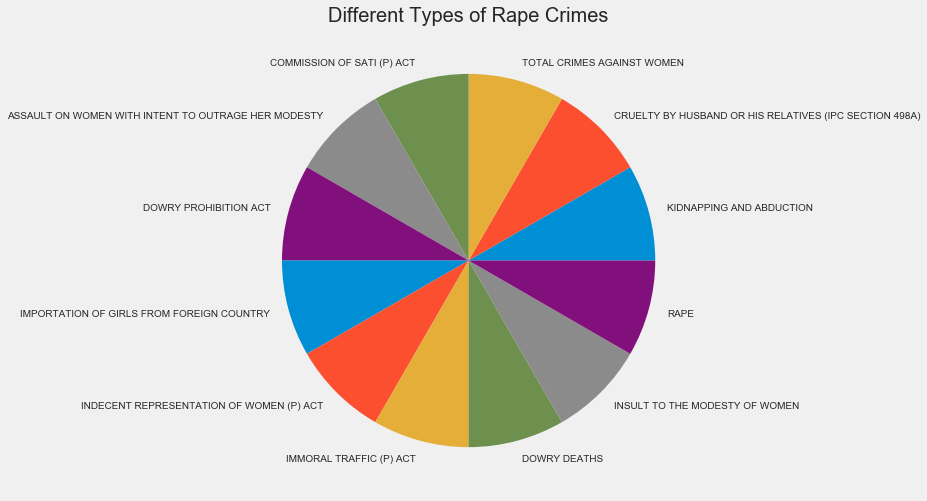

In [95]:
# lets check the values in the crime head

plt.rcParams['figure.figsize'] = (10, 8)
plt.style.use('fivethirtyeight')
rape['CRIME HEAD'].value_counts().plot(kind = 'pie')
plt.title('Different Types of Rape Crimes', fontsize = 20)
plt.axis('off')
plt.show()

In [96]:
# lets check the unique columns in the state and union territories 
rape['STATE/UT'].nunique()

38

In [97]:
# lets check the shape of the dataset
print(rape.shape)

(456, 14)


In [117]:
# lets groupby the data wrt to the states

s = rape.groupby(['STATE/UT'])
s = s.agg('mean')
s = pd.DataFrame(s)
s = s.drop(['TOTAL (ALL-INDIA)', 'TOTAL (STATES)', 'TOTAL (UTs)'], axis = 0)
s.style.bar(color = ['cyan'], align = 'mid')

,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
STATE/UT,,,,,,,,,,,,
A & N ISLANDS,5.66667,5,6,7.33333,5.33333,8.16667,13.3333,14.1667,21,21.8333,14.3333,12.1667
ANDHRA PRADESH,3703,4437.83,4850.17,4829.33,5189.33,5110,5853.5,5971.83,6077.5,6428.33,6294.33,6548
ARUNACHAL PRADESH,36.3333,34.5,26.6667,27,21.5,23.5,33.8333,30,30.3333,32.8333,33.1667,33.6667
ASSAM,916.167,1127.33,1258.5,1352.83,1460,1406.33,1466.17,1421.83,1968.33,2166,1873.5,2057.67
BIHAR,2172.33,2168.17,1887.17,2055.67,1870,1959.5,2492.5,2370.5,2409.5,2189,3026.17,3357.83
CHANDIGARH,29,32.6667,34.3333,55.1667,51,58.6667,48.3333,36,26.3333,23,21.3333,44.6667
CHHATTISGARH,885.333,851.167,811.5,1008.5,915.167,959.667,975.833,1004.33,1056.17,1096.17,1070.5,1099
D & N HAVELI,4,3.16667,4,5.33333,5.83333,4.16667,3.5,10.6667,3.33333,7.66667,2.33333,5
DAMAN & DIU,7,2.33333,1.66667,2.5,2.83333,4.66667,9.5,8.5,6.33333,8.5,9.16667,7.5


In [120]:
# lets check the shape of the rape data 
print(s.shape)

(35, 12)


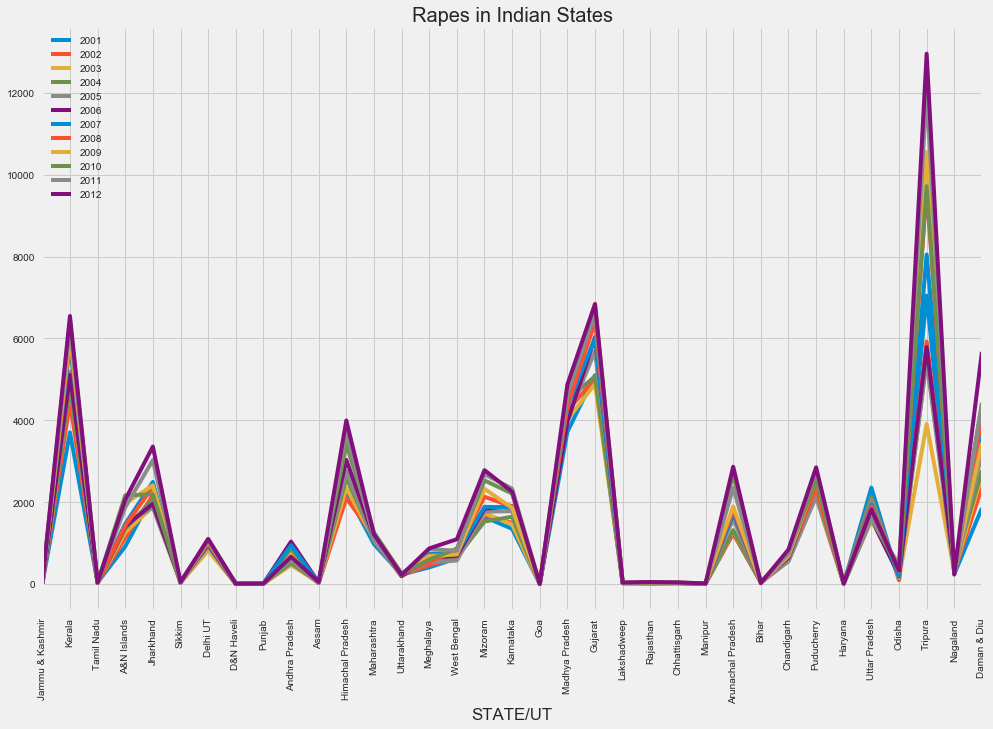

In [123]:
plt.rcParams['figure.figsize'] = (15, 10)
plt.style.use('fivethirtyeight')

s.plot(kind = 'line')
plt.title('Rapes in Indian States', fontsize = 20)
plt.xticks(np.arange(35), ('Jammu & Kashmir', 'Kerala', 'Tamil Nadu', 'A&N Islands', 'Jharkhand',
       'Sikkim', 'Delhi UT', 'D&N Haveli', 'Punjab', 'Andhra Pradesh', 'Assam',
       'Himachal Pradesh', 'Maharashtra', 'Uttarakhand', 'Meghalaya',
       'West Bengal', 'Mizoram', 'Karnataka', 'Goa', 'Madhya Pradesh',
       'Gujarat', 'Lakshadweep', 'Rajasthan', 'Chhattisgarh', 'Manipur',
       'Arunachal Pradesh', 'Bihar', 'Chandigarh', 'Puducherry', 'Haryana',
       'Uttar Pradesh', 'Odisha', 'Tripura','Nagaland','Daman & Diu'),
        rotation = 90)
plt.show()

In [131]:
# lets try to check the crimes state wise

x = rape.groupby(['CRIME HEAD']).agg('mean')
x.style.bar()

,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
CRIME HEAD,,,,,,,,,,,,
ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,3335.05,3407.45,3350.84,3440.45,3428.21,3561.79,3789.71,3855.39,3778.11,3949.26,4244.76,4486.34
COMMISSION OF SATI (P) ACT,0,0,0,0,1.42105,0,0,0.552632,0,0,0,0
CRUELTY BY HUSBAND OR HIS RELATIVES (IPC SECTION 498A),8642.13,8917.58,8733.39,9920.29,10070.5,10830,12348.3,13015.3,13768,14243.1,14265.9,15612.8
DOWRY DEATHS,1609.03,1448.37,1313.37,1430.45,1355.76,1518.47,1745.76,1786.11,1845.32,1837.89,1940.37,1927.74
DOWRY PROHIBITION ACT,557.053,527.289,496.342,494.289,568.184,598.5,814.816,831.711,808.579,953.684,976.737,1246.26
IMMORAL TRAFFIC (P) ACT,1012.34,951.789,876.395,902.211,999.868,930.237,778.5,651.316,615.947,534.868,598.5,635.684
IMPORTATION OF GIRLS FROM FOREIGN COUNTRY,17.3684,7.97368,4.34211,5.36842,16.7368,6.71053,7.5,9.86842,3.86842,6.39474,17.4474,3.63158
INDECENT REPRESENTATION OF WOMEN (P) ACT,54.7895,199.5,84.1579,134.211,234.947,131.447,97.0263,85.7368,69.3947,75.6316,36.3947,13.8158
INSULT TO THE MODESTY OF WOMEN,982.026,1002.47,1211.92,1008.24,1041.47,980.526,1085.76,1179.71,1134.32,821.368,780,877.026


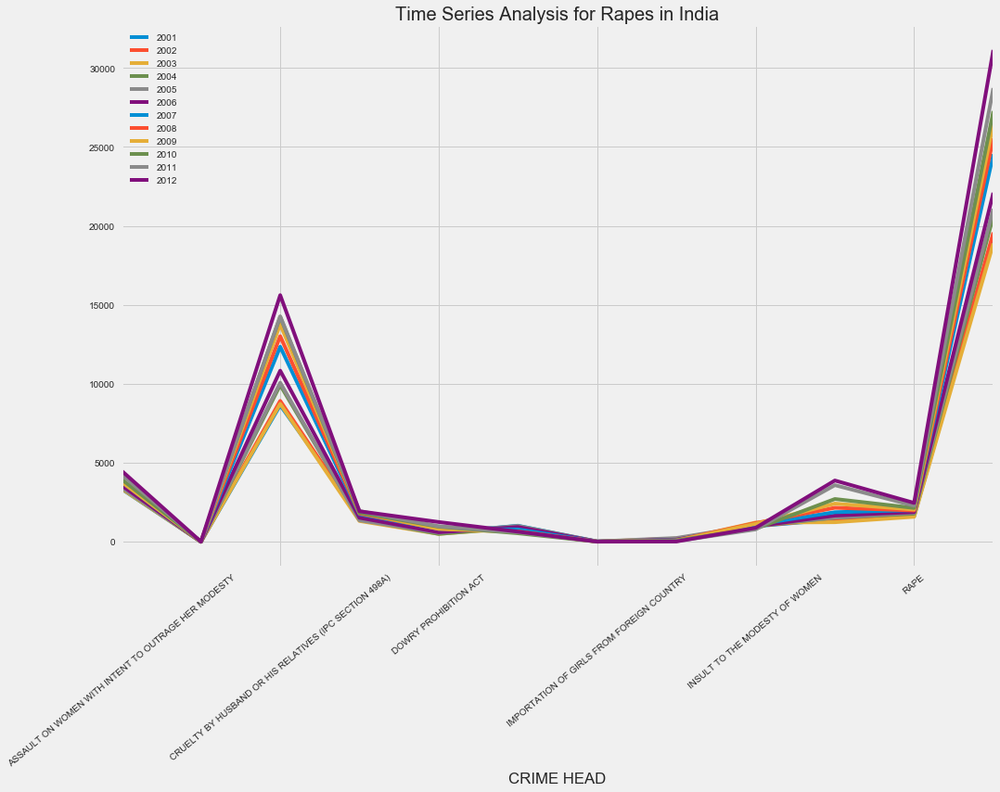

In [138]:
# lets check the status of rape on yearly basis

x.plot()
plt.xticks(rotation = 40)
plt.title('Time Series Analysis for Rapes in India', fontsize = 20)
plt.show()

In [49]:
rape.columns

Index(['STATE/UT', 'CRIME_HEAD', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012'],
      dtype='object')

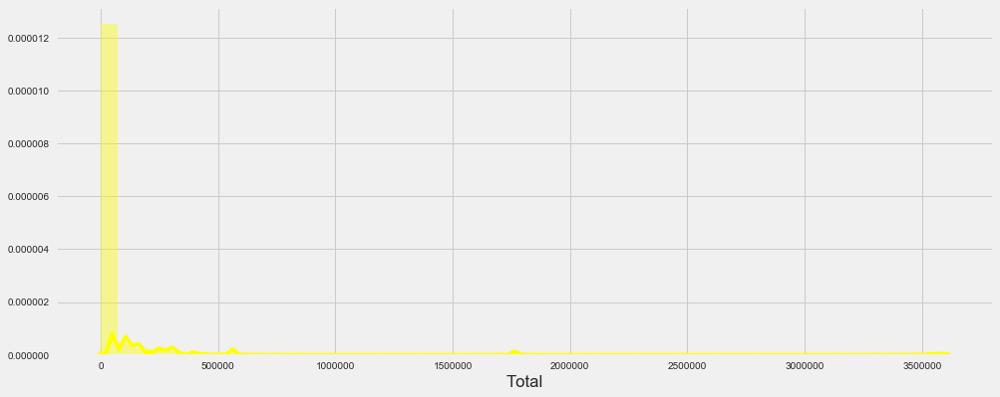

In [12]:
# lets calculate the total no. of cases in each of the states form 2001 o 2012
rape['Total'] = rape['2001'] + rape['2002'] + rape['2003'] + rape['2004'] + rape['2005'] + rape['2006'] + rape['2007'] \
               + rape['2008'] + rape['2009'] + rape['2010'] + rape['2011'] + rape['2012']

# lets also check the total rapes' distribution
plt.rcParams['figure.figsize'] = (15, 6)
sns.distplot(rape['Total'], color = 'yellow')
plt.show()

In [14]:
@interact
def check(Crimes = list(rape['CRIME HEAD'].value_counts().index)):
    r = rape[['STATE/UT','CRIME HEAD', 'Total']]
    r = r[rape['CRIME HEAD'] == Crimes].sort_values(by = 'Total', ascending = False)
    r = r.iloc[2:, [0, 2]]
    return r

interactive(children=(Dropdown(description='Crimes', options=('IMMORAL TRAFFIC (P) ACT', 'RAPE', 'DOWRY PROHIB…

In [15]:
@interact
def check(State = list(rape['STATE/UT'].value_counts().index)):
    r = rape[['STATE/UT','CRIME HEAD', 'Total']]
    return r[rape['STATE/UT'] == State]

interactive(children=(Dropdown(description='State', options=('MEGHALAYA', 'PUDUCHERRY', 'NAGALAND', 'GUJARAT',…

In [41]:
# profile report for Abduction Dataset

profile.ProfileReport(abduction)

## Analyzing Abduction Cases

In [16]:
# lets check the head of the abduction dataset

abduction.head()

,STATE/UT,YEAR,No. Of Cases In Which Offenders Were Known To The Victims,No. Of Cases In Which Offenders Were Parents / Close Family Members,No. Of Cases In Which Offenders Were Relatives,No. Of Cases In Which Offenders Were Neighbours,No. Of Cases In Which Offenders Were Other Known Persons
0,Andhra Pradesh,2013,1635,5,156,626,848
1,Arunachal Pradesh,2013,75,0,6,14,55
2,Assam,2013,1937,8,99,990,840
3,Bihar,2013,1022,6,26,578,412
4,Chhattisgarh,2013,1380,15,70,323,972


In [17]:
# lets check the tail of the dataset
abduction.tail()

,STATE/UT,YEAR,No. Of Cases In Which Offenders Were Known To The Victims,No. Of Cases In Which Offenders Were Parents / Close Family Members,No. Of Cases In Which Offenders Were Relatives,No. Of Cases In Which Offenders Were Neighbours,No. Of Cases In Which Offenders Were Other Known Persons
30,D&N Haveli,2013,3,0,0,0,3
31,Daman & Diu,2013,4,0,0,0,4
32,Delhi UT,2013,1571,47,174,429,921
33,Lakshadweep,2013,2,0,0,0,2
34,Puducherry,2013,17,0,1,7,9


In [18]:
# lets check the columns in the dataset

abduction.columns

Index(['STATE/UT', 'YEAR',
       'No. Of Cases In Which Offenders Were Known To The Victims',
       'No. Of Cases In Which Offenders Were Parents / Close Family Members',
       'No. Of Cases In Which Offenders Were Relatives',
       'No. Of Cases In Which Offenders Were Neighbours',
       'No. Of Cases In Which Offenders Were Other Known Persons'],
      dtype='object')

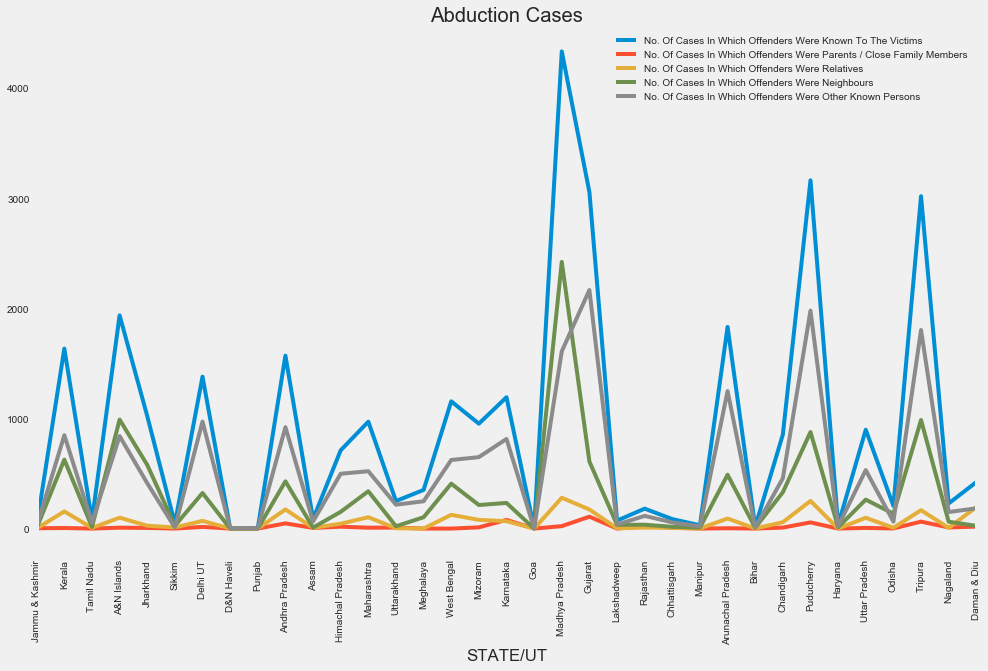

In [155]:
plt.rcParams['figure.figsize'] = (15, 9)
plt.style.use('fivethirtyeight')

x = abduction.groupby('STATE/UT').agg('mean')
x = x.drop(['YEAR'], axis = 1)
x.plot()
plt.grid()
plt.title('Abduction Cases')
plt.xticks(np.arange(35), ('Jammu & Kashmir', 'Kerala', 'Tamil Nadu', 'A&N Islands', 'Jharkhand',
       'Sikkim', 'Delhi UT', 'D&N Haveli', 'Punjab', 'Andhra Pradesh', 'Assam',
       'Himachal Pradesh', 'Maharashtra', 'Uttarakhand', 'Meghalaya',
       'West Bengal', 'Mizoram', 'Karnataka', 'Goa', 'Madhya Pradesh',
       'Gujarat', 'Lakshadweep', 'Rajasthan', 'Chhattisgarh', 'Manipur',
       'Arunachal Pradesh', 'Bihar', 'Chandigarh', 'Puducherry', 'Haryana',
       'Uttar Pradesh', 'Odisha', 'Tripura','Nagaland','Daman & Diu'),
        rotation = 90)
plt.show()

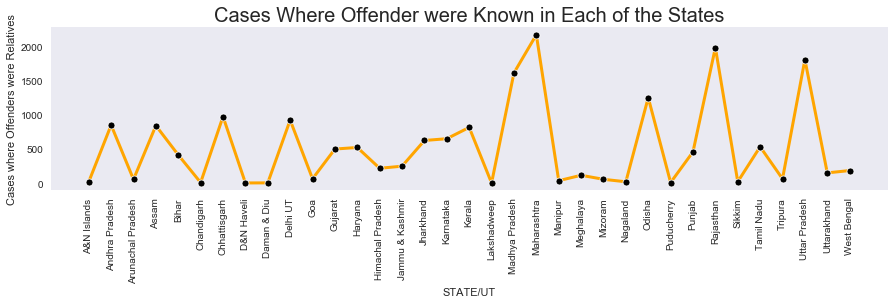

In [148]:
plt.rcParams['figure.figsize'] = (15, 3)
plt.style.use('seaborn-dark')
sns.lineplot(abduction['STATE/UT'],
            abduction['No. Of Cases In Which Offenders Were Other Known Persons'],
             color = 'orange',
             linewidth = 3,
             marker = 'o',
             mfc = 'black'
            )
plt.xticks(rotation = 90)
plt.ylabel('Cases where Offenders were Relatives')
plt.title('Cases Where Offender were Known in Each of the States', fontsize = 20)
plt.show()

* This is a line chart.
* In x-axis you can see the name of the state and in y-axis cases where the offenders were Relatives

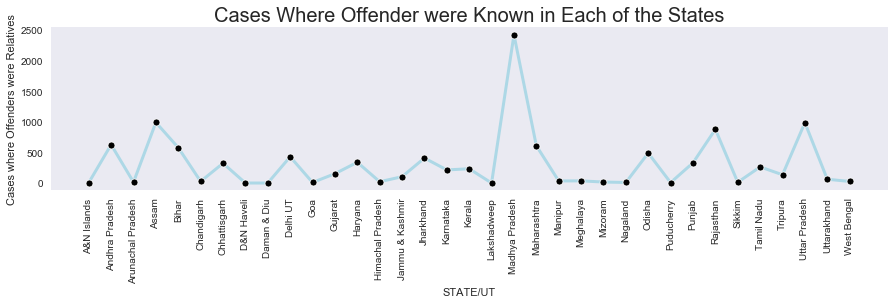

In [147]:
plt.rcParams['figure.figsize'] = (15, 3)
plt.style.use('seaborn-dark')
sns.lineplot(abduction['STATE/UT'],
            abduction['No. Of Cases In Which Offenders Were Neighbours'],
             color = 'lightblue',
             linewidth = 3,
             marker = 'o',
             mfc = 'black'
            )
plt.xticks(rotation = 90)
plt.ylabel('Cases where Offenders were Relatives')
plt.title('Cases Where Offender were Known in Each of the States', fontsize = 20)
plt.show()

* This is a line chart.
* In x-axis you can see the name of the state and in y-axis cases where the offenders were Relatives

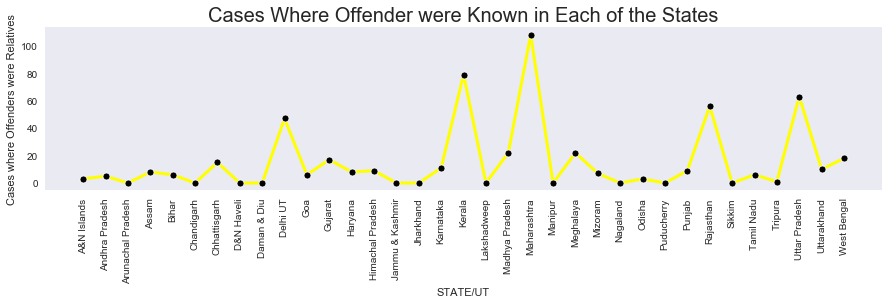

In [278]:
plt.rcParams['figure.figsize'] = (15, 3)
plt.style.use('seaborn-dark')
sns.lineplot(abduction['STATE/UT'],
            abduction['No. Of Cases In Which Offenders Were Parents / Close Family Members'],
             color = 'yellow',
             linewidth = 3,
             marker = 'o',
             mfc = 'black'
            )
plt.xticks(rotation = 90)
plt.ylabel('Cases where Offenders were Relatives')
plt.title('Cases Where Offender were Known in Each of the States', fontsize = 20)
plt.show()

* This is a line chart.
* In x-axis you can see the name of the state and in y-axis cases where the offenders were Relatives

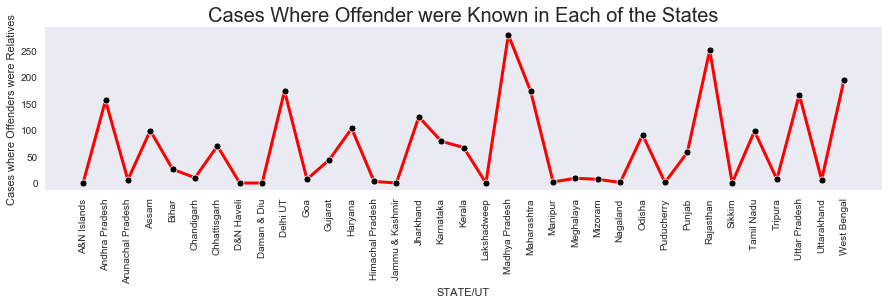

In [143]:
plt.rcParams['figure.figsize'] = (15, 3)
plt.style.use('seaborn-dark')
sns.lineplot(abduction['STATE/UT'],
            abduction['No. Of Cases In Which Offenders Were Relatives'],
             color = 'red',
             linewidth = 3,
             marker = 'o',
             mfc = 'black'
            )
plt.xticks(rotation = 90)
plt.ylabel('Cases where Offenders were Relatives')
plt.title('Cases Where Offender were Known in Each of the States', fontsize = 20)
plt.show()

* This is a line chart which is used to show the cases where offender were known in each of the state.

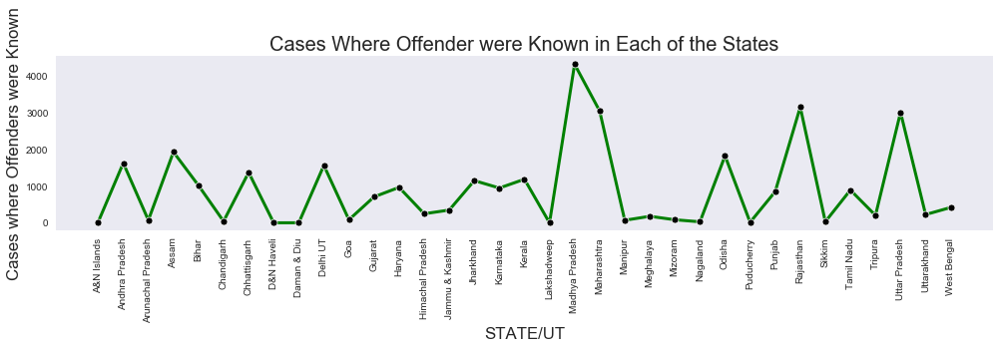

In [139]:
plt.rcParams['figure.figsize'] = (15, 3)
plt.style.use('seaborn-dark')
sns.lineplot(abduction['STATE/UT'],
              abduction['No. Of Cases In Which Offenders Were Known To The Victims'],
            color = 'green',
            linewidth = 3,
             marker = 'o',
             mfc = 'black'
            )
plt.xticks(rotation = 90)
plt.ylabel('Cases where Offenders were Known')
plt.title('Cases Where Offender were Known in Each of the States', fontsize = 20)
plt.show()

In [140]:
import warnings
warnings.filterwarnings('ignore')


figure = bubbleplot(dataset = abduction,
                    x_column='No. Of Cases In Which Offenders Were Known To The Victims',
                    y_column='No. Of Cases In Which Offenders Were Relatives', 
                    bubble_column='STATE/UT',
                    size_column='No. Of Cases In Which Offenders Were Known To The Victims',
                    color_column='STATE/UT', 
                    x_title="Offenders known",
                    y_title="Offenders Relatives",
                    title='Offenders known vs Relatives',
                    x_logscale=False,
                    scale_bubble=3,
                    height=650)

iplot(figure, config={'scrollzoom': True})

* This is a bubble plot.
* This plot is showing the abduction of girls by their relatives or known person

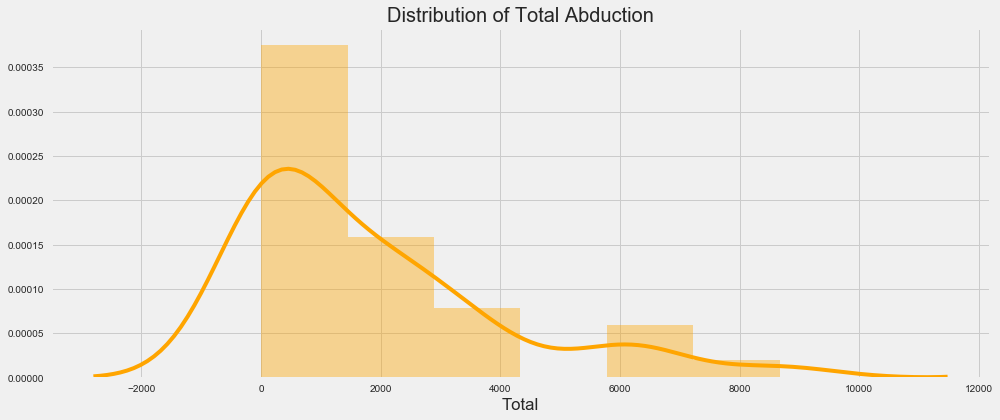

In [28]:
abduction['Total'] = abduction['No. Of Cases In Which Offenders Were Known To The Victims'] + \
                      abduction['No. Of Cases In Which Offenders Were Parents / Close Family Members'] + \
                      abduction['No. Of Cases In Which Offenders Were Relatives'] + \
                       abduction['No. Of Cases In Which Offenders Were Neighbours'] + \
                        abduction['No. Of Cases In Which Offenders Were Other Known Persons']
# lets check the distribution of the total abduction crimes
sns.distplot(abduction['Total'], color = 'orange')
plt.title('Distribution of Total Abduction', fontsize = 20)
plt.show()

In [32]:
@interact
def check(crimes = 'Total',
           cases = 1000):
    a = abduction[['STATE/UT', 'Total']][abduction[crimes] > cases]
    a = a.sort_values(by = 'Total', ascending = False)
    return a

interactive(children=(Text(value='Total', description='crimes'), IntSlider(value=1000, description='cases', ma…

## Analyzing Murders 

In [33]:
# lets check the head of the dataset
murder.head()

,STATE/UT,YEAR,GENDER,Upto 10 years,10-15 years,15-18 years,18-30 years,30-50 years,Above 50 years,Total
0,Andhra Pradesh,2013,Male,26,9,19,445,1036,199,1734
1,Andhra Pradesh,2013,Female,20,9,11,287,300,123,750
2,Andhra Pradesh,2013,Total,46,18,30,732,1336,322,2484
3,Arunachal Pradesh,2013,Male,0,0,1,32,31,1,65
4,Arunachal Pradesh,2013,Female,0,1,1,2,0,0,4


In [34]:
# lets check the columns in the dataset

murder.columns

Index(['STATE/UT', 'YEAR', 'GENDER', 'Upto 10 years', '10-15 years',
       '15-18 years', '18-30 years', '30-50 years', 'Above 50 years', 'Total'],
      dtype='object')

In [35]:
# lets analyze the total murders in each of the states

total  = murder[murder['GENDER'] == 'Total']
total.style.bar()

,STATE/UT,YEAR,GENDER,Upto 10 years,10-15 years,15-18 years,18-30 years,30-50 years,Above 50 years,Total
2,Andhra Pradesh,2013,Total,46,18,30,732,1336,322,2484
5,Arunachal Pradesh,2013,Total,0,1,2,34,31,1,69
8,Assam,2013,Total,0,3,11,895,399,46,1354
11,Bihar,2013,Total,44,36,106,1874,1231,150,3441
14,Chhattisgarh,2013,Total,45,20,46,289,400,174,974
17,Goa,2013,Total,0,0,0,16,12,9,37
20,Gujarat,2013,Total,77,10,10,440,452,173,1162
23,Haryana,2013,Total,27,15,45,452,382,87,1008
26,Himachal Pradesh,2013,Total,6,2,0,37,45,16,106
29,Jammu & Kashmir,2013,Total,10,3,0,61,97,13,184


In [36]:
total.index = ('Jammu & Kashmir', 'Kerala', 'Tamil Nadu', 'A&N Islands', 'Jharkhand',
       'Sikkim', 'Delhi UT', 'D&N Haveli', 'Punjab', 'Andhra Pradesh', 'Assam',
       'Himachal Pradesh', 'Maharashtra', 'Uttarakhand', 'Meghalaya',
       'West Bengal', 'Mizoram', 'Karnataka', 'Goa', 'Madhya Pradesh',
       'Gujarat', 'Lakshadweep', 'Rajasthan', 'Chhattisgarh', 'Manipur',
       'Arunachal Pradesh', 'Bihar', 'Chandigarh', 'Puducherry', 'Haryana',
       'Uttar Pradesh', 'Odisha', 'Tripura','Nagaland','Daman & Diu')
total.index

Index(['Jammu & Kashmir', 'Kerala', 'Tamil Nadu', 'A&N Islands', 'Jharkhand',
       'Sikkim', 'Delhi UT', 'D&N Haveli', 'Punjab', 'Andhra Pradesh', 'Assam',
       'Himachal Pradesh', 'Maharashtra', 'Uttarakhand', 'Meghalaya',
       'West Bengal', 'Mizoram', 'Karnataka', 'Goa', 'Madhya Pradesh',
       'Gujarat', 'Lakshadweep', 'Rajasthan', 'Chhattisgarh', 'Manipur',
       'Arunachal Pradesh', 'Bihar', 'Chandigarh', 'Puducherry', 'Haryana',
       'Uttar Pradesh', 'Odisha', 'Tripura', 'Nagaland', 'Daman & Diu'],
      dtype='object')

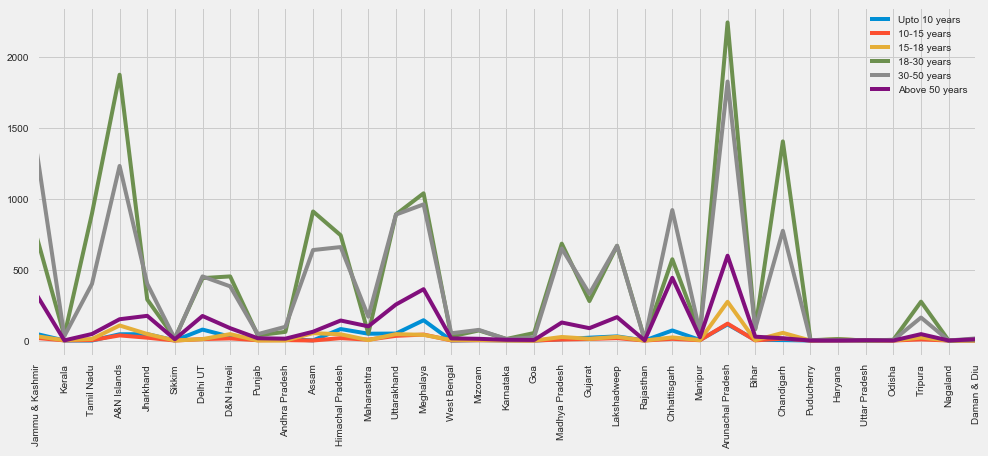

In [37]:
# lets plot a line chart

total = total.drop(['YEAR','GENDER','Total'], axis = 1)
total.plot(kind = 'line')
plt.xticks(rotation = 40)
plt.xticks(np.arange(35), ('Jammu & Kashmir', 'Kerala', 'Tamil Nadu', 'A&N Islands', 'Jharkhand',
       'Sikkim', 'Delhi UT', 'D&N Haveli', 'Punjab', 'Andhra Pradesh', 'Assam',
       'Himachal Pradesh', 'Maharashtra', 'Uttarakhand', 'Meghalaya',
       'West Bengal', 'Mizoram', 'Karnataka', 'Goa', 'Madhya Pradesh',
       'Gujarat', 'Lakshadweep', 'Rajasthan', 'Chhattisgarh', 'Manipur',
       'Arunachal Pradesh', 'Bihar', 'Chandigarh', 'Puducherry', 'Haryana',
       'Uttar Pradesh', 'Odisha', 'Tripura','Nagaland','Daman & Diu'),
        rotation = 90)
plt.show()

In [39]:
# lets check the gender column in the Murder dataset
murder['GENDER'].value_counts()

Female    35
Male      35
Total     35
Name: GENDER, dtype: int64

In [40]:
# lets create a data where we have only males and females in the gender column

genders = ['Male','Female']
gender = murder.loc[murder['GENDER'].isin(genders), :]
gender.head()

,STATE/UT,YEAR,GENDER,Upto 10 years,10-15 years,15-18 years,18-30 years,30-50 years,Above 50 years,Total
0,Andhra Pradesh,2013,Male,26,9,19,445,1036,199,1734
1,Andhra Pradesh,2013,Female,20,9,11,287,300,123,750
3,Arunachal Pradesh,2013,Male,0,0,1,32,31,1,65
4,Arunachal Pradesh,2013,Female,0,1,1,2,0,0,4
6,Assam,2013,Male,0,3,11,827,370,46,1257


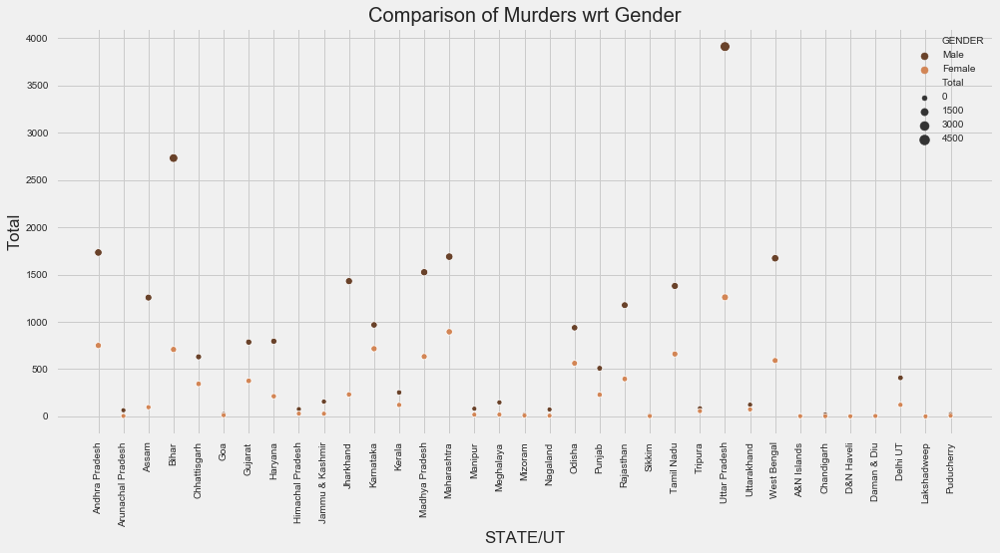

In [41]:
# lets make a comparison of murders between males and females

plt.rcParams['figure.figsize'] = (15, 7)
plt.style.use('fivethirtyeight')

sns.scatterplot(gender['STATE/UT'],
               gender['Total'],
               hue = gender['GENDER'],
               palette = 'copper',
                size = gender['Total'],
            )
plt.title('Comparison of Murders wrt Gender', fontsize = 20)
plt.xticks(rotation = 90)
plt.show()

In [42]:
murder['YEAR'].value_counts()

2013    105
Name: YEAR, dtype: int64

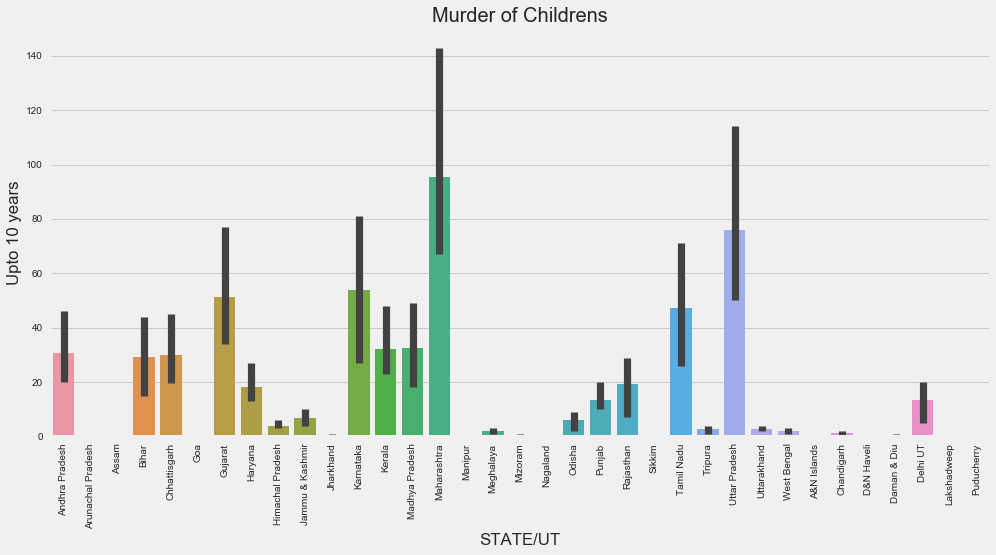

In [43]:
plt.rcParams['figure.figsize'] = (15, 7)
plt.style.use('fivethirtyeight')

sns.barplot(murder['STATE/UT'],
            murder['Upto 10 years'],
            )
plt.xticks(rotation = 90)
plt.title('Murder of Childrens', fontsize = 20)
plt.show()

* This is a bar chart.
* This chart is showing here crimes againest the girls up to 10 years old.

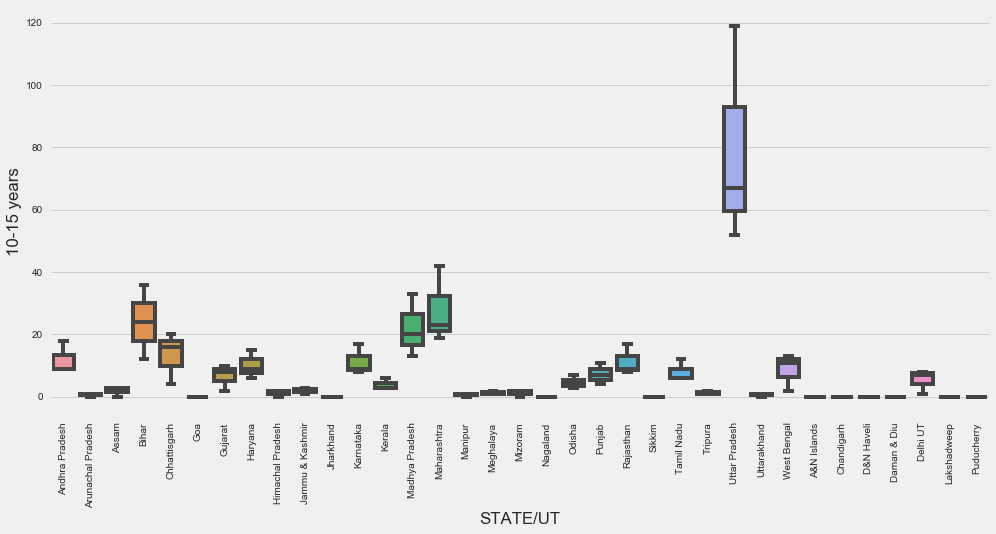

In [44]:
plt.rcParams['figure.figsize'] = (15, 7)
plt.style.use('fivethirtyeight')

sns.boxplot(murder['STATE/UT'],
            murder['10-15 years'],
            )
plt.xticks(rotation = 90)
plt.show()

* This is a boxen chart which is used to show the crime against girls in age between 10 to 15 years.

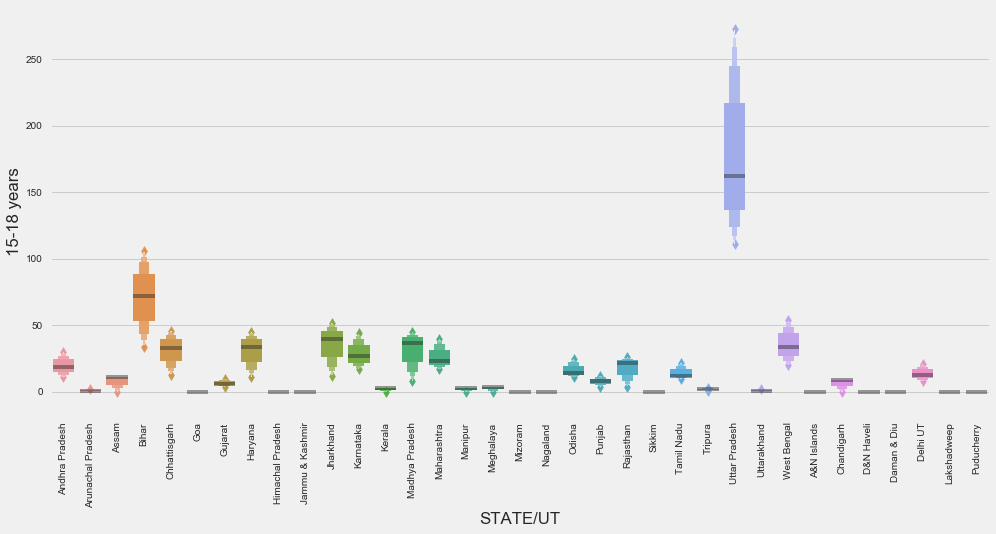

In [45]:
plt.rcParams['figure.figsize'] = (15, 7)
plt.style.use('fivethirtyeight')

sns.boxenplot(murder['STATE/UT'],
            murder['15-18 years'],
            )
plt.xticks(rotation = 90)
plt.show()

* This is a boxen chart.
* This chart is showing the crimes against women who is 15-18 years old.

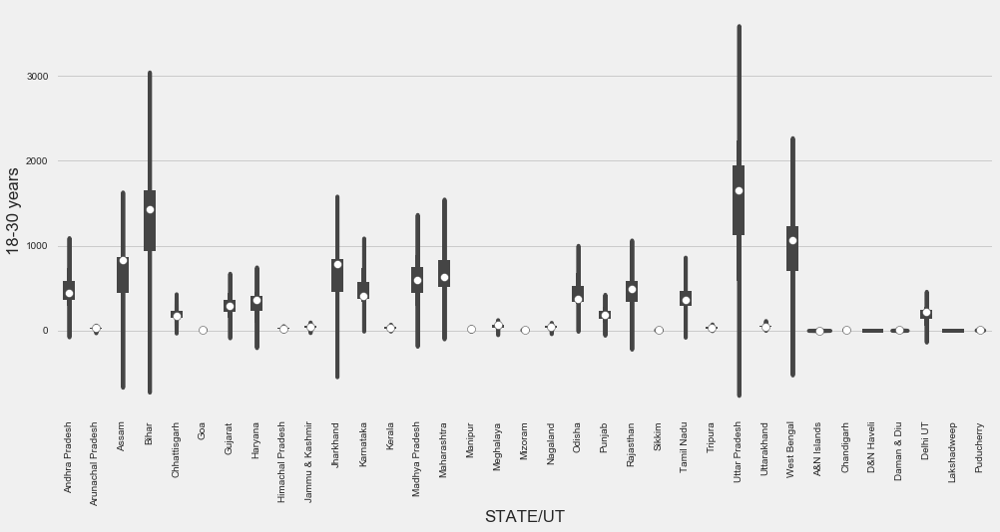

In [46]:
plt.rcParams['figure.figsize'] = (15, 7)
plt.style.use('fivethirtyeight')

sns.violinplot(murder['STATE/UT'],
            murder['18-30 years'],
            )
plt.xticks(rotation = 90)
plt.show()

* This is a violin chart.
* This chart is showing the crimes against wommen who is 18-30 years old.

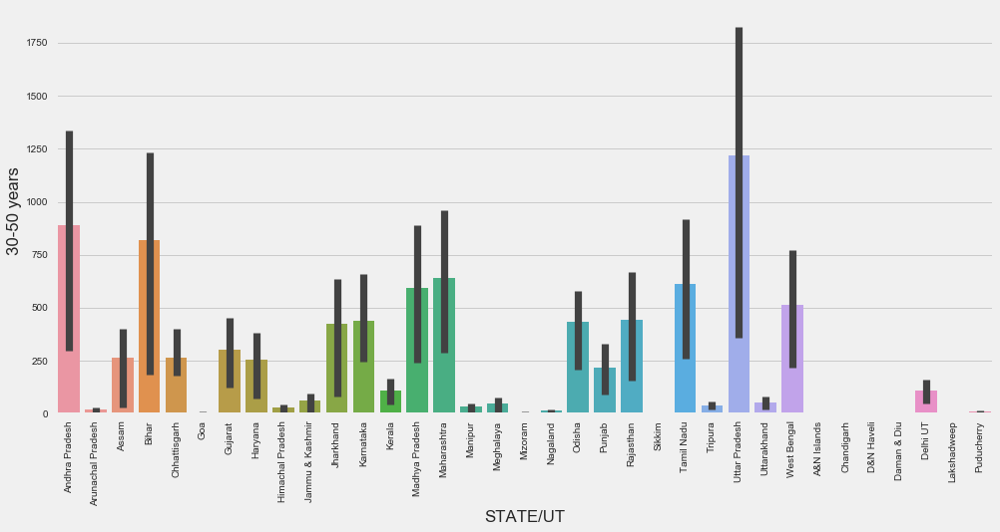

In [47]:
plt.rcParams['figure.figsize'] = (15, 7)
plt.style.use('fivethirtyeight')

sns.barplot(murder['STATE/UT'],
            murder['30-50 years'],
            )
plt.xticks(rotation = 90)
plt.show()

* This is a bar chart.
* In x-axis you see the name of states and in y-axis years

In [183]:
x = murder.pivot_table(index = 'STATE/UT',
                       columns = 'GENDER',
                       values = ['Upto 10 years', 
                            '10-15 years',
                            '15-18 years',
                            '18-30 years',
                            '30-50 years',
                            'Above 50 years']
                                   )
plt.rcParams['figure.figsize'] = (10, 2)
print(x)

                  10-15 years            15-18 years            18-30 years  \
GENDER                 Female Male Total      Female Male Total      Female   
STATE/UT                                                                      
A&N Islands                 0    0     0           0    0     0           0   
Andhra Pradesh              9    9    18          11   19    30         287   
Arunachal Pradesh           1    0     1           1    1     2           2   
Assam                       0    3     3           0   11    11          68   
Bihar                      12   24    36          34   72   106         446   
Chandigarh                  0    0     0           0    9     9           0   
Chhattisgarh                4   16    20          13   33    46         113   
D&N Haveli                  0    0     0           0    0     0           0   
Daman & Diu                 0    0     0           0    0     0           2   
Delhi UT                    1    7     8           8

In [190]:
# lets check the profile report of Murder
profile.ProfileReport(murder)

## Analyzing Road Accidents

In [195]:
# lets check the head of the accidents data
accident.head()

,Name of City,Total number of Fatal Accidents - 2011,All Accidents - 2011,Persons Killed - 2011,Persons Injured - 2011,Total number of Fatal Accidents - 2012,All Accidents - 2012,Persons Killed - 2012,Persons Injured - 2012,Fatal Accidents - 2013,Total Accidents - 2013,Killed - 2013,Injured - 2013,Severity - 2013,Fatal Accidents - 2014,Greviously Injured Accidents - 2014,Minor Accidents - 2014,Non-Injurey Accidents - 2014,Total Accidents - 2014,Killed - 2014,Injured - 2014,Severity - 2014,Fatal Accidents - 2015,Greviously Injured Accidents - 2015,Minor Accidents - 2015,Non-Injurey Accidents - 2015,Total Accidents - 2015,Killed - 2015,Injured - 2015,Severity - 2015
0,Agra,336.0,1299.0,632.0,1046.0,381.0,922.0,427.0,675.0,436.0,1008.0,502.0,750.0,49.8,405.0,432.0,127.0,31.0,995.0,503.0,747.0,50.6,498.0,369.0,260.0,16.0,1143.0,474.0,650.0,41.5
1,Ahmedabad,222.0,2020.0,227.0,2036.0,245.0,1850.0,251.0,1845.0,227.0,1888.0,230.0,1855.0,12.2,256.0,263.0,1123.0,0.0,1642.0,262.0,1597.0,16.0,318.0,351.0,1168.0,0.0,1837.0,328.0,1722.0,17.9
2,Asansol-Durgapur,229.0,368.0,230.0,185.0,199.0,380.0,224.0,315.0,200.0,433.0,218.0,404.0,50.3,195.0,167.0,70.0,11.0,443.0,210.0,284.0,47.4,210.0,160.0,60.0,16.0,446.0,210.0,220.0,47.1
3,Aurangabad,161.0,719.0,173.0,744.0,178.0,715.0,192.0,649.0,150.0,565.0,160.0,547.0,28.3,161.0,254.0,99.0,46.0,560.0,170.0,578.0,30.4,153.0,297.0,147.0,57.0,654.0,170.0,670.0,26.0
4,Bengaluru,689.0,6031.0,720.0,4952.0,707.0,5508.0,725.0,4527.0,733.0,5215.0,752.0,4334.0,14.4,703.0,1385.0,1934.0,982.0,5004.0,729.0,4098.0,14.6,708.0,1331.0,1899.0,896.0,4834.0,713.0,4057.0,14.7


In [197]:
# lets check the columns in the accidents data
accident.columns

Index(['Name of City', 'Total number of Fatal Accidents - 2011',
       'All Accidents - 2011', 'Persons Killed - 2011',
       'Persons Injured - 2011', 'Total number of Fatal Accidents - 2012',
       'All Accidents - 2012', 'Persons Killed - 2012',
       'Persons Injured - 2012', 'Fatal Accidents - 2013',
       'Total Accidents - 2013', 'Killed - 2013', 'Injured - 2013',
       'Severity - 2013', 'Fatal Accidents - 2014',
       'Greviously Injured Accidents - 2014', 'Minor Accidents - 2014',
       'Non-Injurey Accidents - 2014', 'Total Accidents - 2014',
       'Killed - 2014', 'Injured - 2014', 'Severity - 2014',
       'Fatal Accidents - 2015', 'Greviously Injured Accidents - 2015',
       'Minor Accidents - 2015', 'Non-Injurey Accidents - 2015',
       'Total Accidents - 2015', 'Killed - 2015', 'Injured - 2015',
       'Severity - 2015'],
      dtype='object')

In [198]:
# lets check the info of the data
accident.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 30 columns):
Name of City                              52 non-null object
Total number of Fatal Accidents - 2011    39 non-null float64
All Accidents - 2011                      40 non-null float64
Persons Killed - 2011                     40 non-null float64
Persons Injured - 2011                    40 non-null float64
Total number of Fatal Accidents - 2012    51 non-null float64
All Accidents - 2012                      51 non-null float64
Persons Killed - 2012                     51 non-null float64
Persons Injured - 2012                    51 non-null float64
Fatal Accidents - 2013                    51 non-null float64
Total Accidents - 2013                    51 non-null float64
Killed - 2013                             51 non-null float64
Injured - 2013                            51 non-null float64
Severity - 2013                           51 non-null float64
Fatal Accidents - 2014        

In [199]:
# lets check the shape of the dataset
accident.shape

(52, 30)

In [207]:
# lets remove the total no. of accidents to visualize the accidents rate properly
t = ['Total']
accident = accident.loc[~accident['Name of City'].isin(t), :]
accident.shape

(51, 30)

In [212]:
accident['Name of City'].value_counts().index

Index(['Chennai', 'Ludhiana', 'Jamshedpur', 'Indore', 'Dhanbad', 'Khozikode',
       'Mallapuram', 'Faridabad', 'Varanasi', 'Srinagar', 'Kollam', 'Jodhpur',
       'Jabalpur', 'Chandigarh', 'Mumbai', 'Allahabad', 'Aurangabad', 'Pune',
       'Kanpur', 'Hyderabad', 'Visakhapatnam', 'Raipur', 'Kota', 'Nagpur',
       'Delhi', 'Ahmedabad', 'Lucknow', 'Asansol-Durgapur', 'Vadodra', 'Agra',
       'Jaipur', 'Thiruvanthapuram', 'Rajkot', 'Thrissur', 'Coimbatore',
       'Kolkata', 'Madurai', 'Vizaq', 'Amritsar', 'Gwalior', 'Ghaziabad',
       'Nashik', 'Meerut', 'Kochi', 'Vijaywada City', 'Kannur', 'Surat',
       'Patna', 'Bhopal', 'Tiruchirapalli', 'Bengaluru'],
      dtype='object')

In [208]:
# lets make an interactive visualization to check the accidents in India

plt.rcParams['figure.figsize'] = (14, 5)
plt.style.use('fivethirtyeight')

@interact_manual
def check(column = 'Name of City',
          column2 = accident.select_dtypes('number'),
          color = ['black','orange','gold']):
    sns.lineplot(accident[column],
                 accident[column2],
                color = color)
    plt.xticks(rotation = 90)
    plt.show()

interactive(children=(Text(value='Name of City', description='column'), Dropdown(description='column2', option…

In [210]:
# lets segregate the data wrt Year

y_2011 = accident.loc[:,['Name of City',
                      'Total number of Fatal Accidents - 2011',
                      'All Accidents - 2011', 
                     'Persons Killed - 2011',
                      'Persons Injured - 2011']]

# lets check the shape of the data
y_2011.shape

(51, 5)

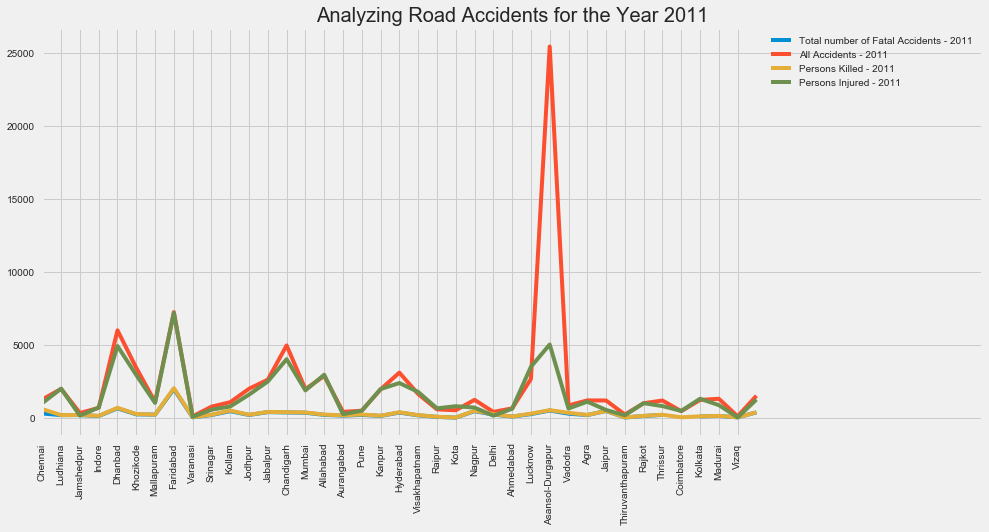

In [221]:
# lets plot the data for the year 2011
plt.rcParams['figure.figsize'] = (15, 7)
plt.style.use('fivethirtyeight')

y_2011.plot()
plt.xticks(np.arange(38), ('Chennai', 'Ludhiana', 'Jamshedpur', 'Indore', 'Dhanbad', 'Khozikode',
       'Mallapuram', 'Faridabad', 'Varanasi', 'Srinagar', 'Kollam', 'Jodhpur',
       'Jabalpur', 'Chandigarh', 'Mumbai', 'Allahabad', 'Aurangabad', 'Pune',
       'Kanpur', 'Hyderabad', 'Visakhapatnam', 'Raipur', 'Kota', 'Nagpur',
       'Delhi', 'Ahmedabad', 'Lucknow', 'Asansol-Durgapur', 'Vadodra', 'Agra',
       'Jaipur', 'Thiruvanthapuram', 'Rajkot', 'Thrissur', 'Coimbatore',
       'Kolkata', 'Madurai', 'Vizaq', 'Amritsar', 'Gwalior', 'Ghaziabad',
       'Nashik', 'Meerut', 'Kochi', 'Vijaywada City', 'Kannur', 'Surat',
       'Patna', 'Bhopal', 'Tiruchirapalli', 'Bengaluru'),
           rotation = 90)
plt.title('Analyzing Road Accidents for the Year 2011', fontsize = 20)
plt.show()
           

In [222]:
# lets segregate the data wrt Year

y_2012 = accident.loc[:,['Name of City',
                      'Total number of Fatal Accidents - 2012',
                      'All Accidents - 2012', 
                     'Persons Killed - 2012',
                      'Persons Injured - 2012']]

# lets check the shape of the data
y_2012.shape

(51, 5)

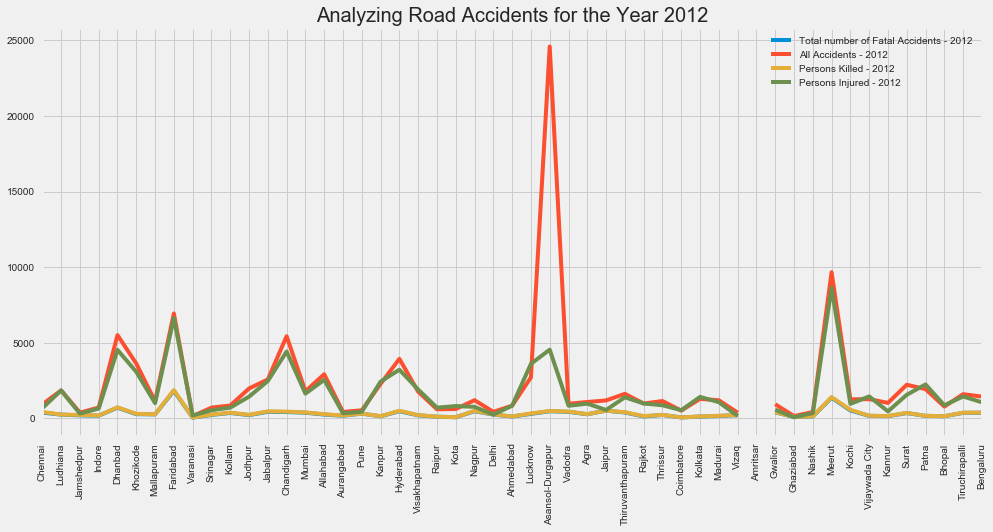

In [233]:
# lets plot the data for the year 2011
plt.rcParams['figure.figsize'] = (15, 7)
plt.style.use('fivethirtyeight')

y_2012.plot()
plt.xticks(np.arange(51), ('Chennai', 'Ludhiana', 'Jamshedpur', 'Indore', 'Dhanbad', 'Khozikode',
       'Mallapuram', 'Faridabad', 'Varanasi', 'Srinagar', 'Kollam', 'Jodhpur',
       'Jabalpur', 'Chandigarh', 'Mumbai', 'Allahabad', 'Aurangabad', 'Pune',
       'Kanpur', 'Hyderabad', 'Visakhapatnam', 'Raipur', 'Kota', 'Nagpur',
       'Delhi', 'Ahmedabad', 'Lucknow', 'Asansol-Durgapur', 'Vadodra', 'Agra',
       'Jaipur', 'Thiruvanthapuram', 'Rajkot', 'Thrissur', 'Coimbatore',
       'Kolkata', 'Madurai', 'Vizaq', 'Amritsar', 'Gwalior', 'Ghaziabad',
       'Nashik', 'Meerut', 'Kochi', 'Vijaywada City', 'Kannur', 'Surat',
       'Patna', 'Bhopal', 'Tiruchirapalli', 'Bengaluru'),
           rotation = 90)
plt.title('Analyzing Road Accidents for the Year 2012', fontsize = 20)
plt.show()
           

In [ ]:
# lets segregate the data wrt Year

y_2013 = accident.loc[:,['Name of City',
                      'Total number of Fatal Accidents - 2013',
                      'All Accidents - 2013', 
                     'Persons Killed - 2013',
                      'Persons Injured - 2013']]

# lets check the shape of the data
y_2012.shape